# Ejercicio 3: Mapas de Coropletas de la Encuesta CASEN 2013

Eduardo Graells-Garrido (egraells@udd.cl), Diego Caro (dcaro@udd.cl).

En este ejercicio definiremos una función para visualizar datos geoespaciales utilizando *mapas de coropletas*. Esta técnica de visualización en inglés se llama [Choropleth Map](https://en.wikipedia.org/wiki/Choropleth_map), y es utilizada comúnmente para mostrar distribuciones de datos en mapas, adjudicando uno o más valores dentro de una escala a cada área del mapa. 

Como este tipo de visualización colorea cada área del mapa de acuerdo a su valor dentro de una distribución específica, es posible encontrar patrones geográficos. 

Los ejemplos más comunes son los mapas electorales y mapas de distribución de ingreso (o similares). Aquí hay un ejemplo de un mapa de coropletas por áreas censales de Santiago, mostrando la distribución de grupos socioeconómicos:

![](img/03_choropleth_stgo.jpg)

Ahora bien, hay que tener cuidado cuando se elaboran estos mapas porque debemos asegurarnos que las variables a analizar en distintas áreas sean relativas. Por ejemplo, no es lo mismo comparar cantidad de votos totales por un candidato en comunas, sino que deben compararse los porcentajes. Estas problemáticas las trabajaremos a lo largo del curso :)

## Bibliotecas y Configuración

Como siempre, lo primero que haremos será cargar todas las herramientas necesarias para ejecutar este notebook.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

from carpynter import choropleth

sns.set(context='poster', style='ticks', palette='Accent', font_scale=1.1)
%matplotlib inline

## Comunas de Santiago

Queremos visualizar datos geoespaciales, y por ende lo primero que necesitamos es cargar la geografía. Para ello cargaremos los bordes comunales de acuerdo al _shapefile_ de comunas que dispone la Biblioteca Nacional del Congreso. Lo cargaremos usando GeoPandas:

In [2]:
municipalities = gpd.read_file('./input/shapefile_comunas/division_comunal.shp', crs={'init': 'epsg:5361'})
municipalities.head()

,NOM_REG,NOM_PROV,NOM_COM,SHAPE_LENG,DIS_ELEC,CIR_SENA,COD_COMUNA,SHAPE_Le_1,SHAPE_Area,geometry
0,Región de La Araucanía,Malleco,Ercilla,170675.595438,48,14,9204,170675.595706,4.979025e+08,"POLYGON ((190393.2198999999 5794527.3661, 1904..."
1,Región de La Araucanía,Malleco,Lonquimay,346907.195437,49,14,9205,346907.195899,3.932854e+09,"POLYGON ((294265.5926999999 5781748.8701, 2943..."
2,Región de La Araucanía,Malleco,Los Sauces,169844.122286,48,14,9206,169844.122239,8.519730e+08,"POLYGON ((155495.1031999998 5804765.8096, 1555..."
3,Región de La Araucanía,Malleco,Lumaco,227705.219204,48,14,9207,227705.218806,1.112643e+09,"POLYGON ((159561.5301000001 5778741.6606, 1597..."
4,Región de La Araucanía,Malleco,Purén,137030.480474,48,14,9208,137030.480353,4.654760e+08,"POLYGON ((145272.5931000002 5804247.7066, 1453..."


Recordemos que el sistema de coordenadas que utiliza este archivo está en metros, no en latitud/longitud. Esto permite realizar operaciones como estimar el área de cada comuna:

In [3]:
municipalities['area_km2'] = municipalities.area / 1000000

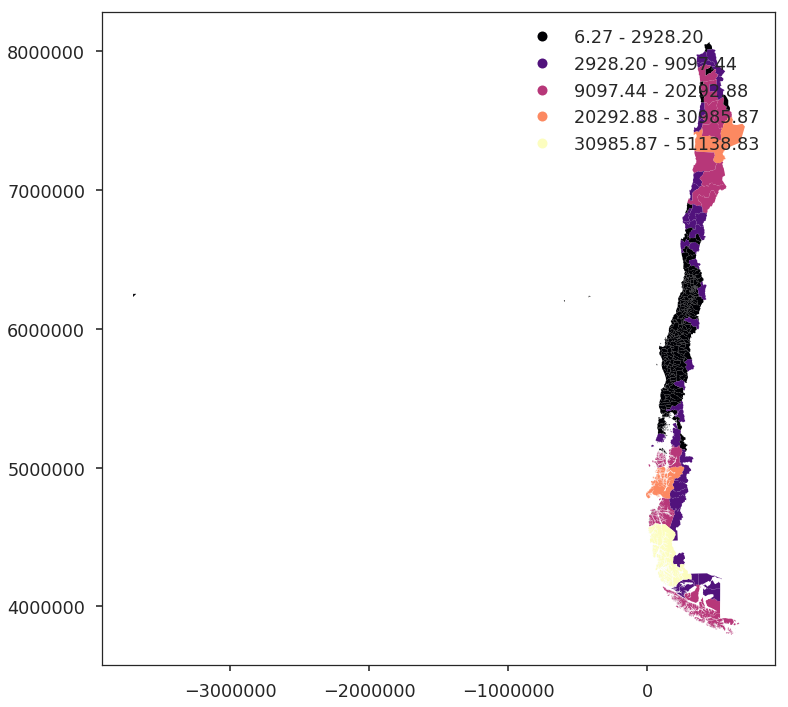

In [4]:
municipalities.plot(figsize=(20,12), column='area_km2', scheme='fisher_jenks', cmap='magma', legend=True)

In [6]:
metropolitan_region = municipalities[municipalities.NOM_REG == 'Región Metropolitana de Santiago']
metropolitan_region.shape

(52, 11)

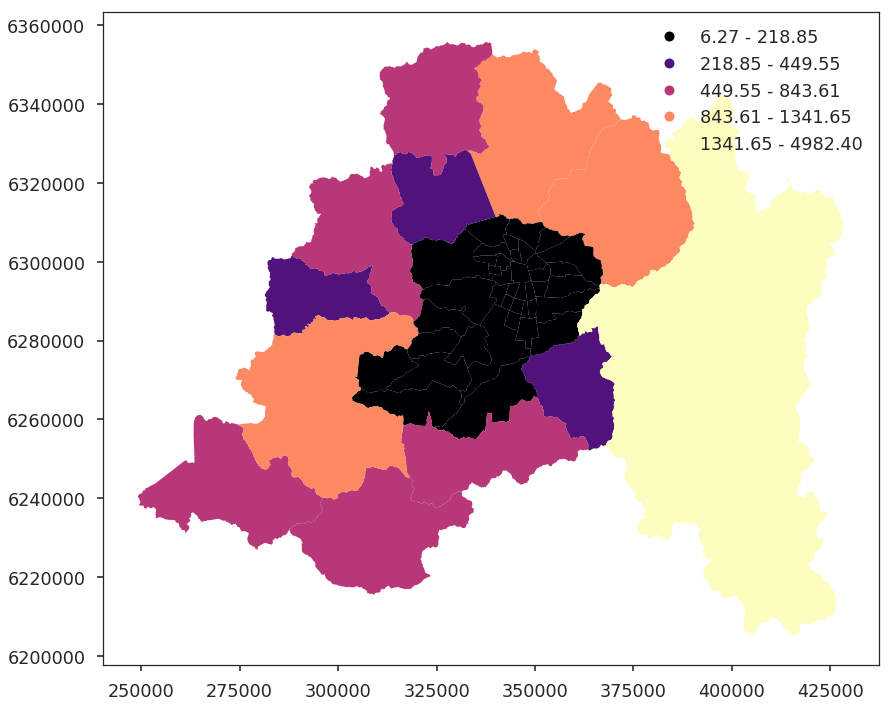

In [7]:
metropolitan_region.plot(figsize=(20,12), column='area_km2', scheme='fisher_jenks', cmap='magma', legend=True)

## Urban Areas

In [8]:
urban_areas = gpd.read_file('./input/urban_areas/', crs={'init': 'epsg:5361'})
               #.to_crs({'init': 'epsg:4326'}))
urban_areas.sample(5)

,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area,geometry
86,Cherquenco,Pueblo,6413.700677,1.147473e+06,"POLYGON ((237965.4245999996 5714187.4779, 2377..."
195,Zapallar,Pueblo,5250.721000,1.037881e+06,"POLYGON ((268714.1091 6395486.8016, 268822.591..."
102,Curarrehue,Pueblo,7017.765728,8.982859e+05,"POLYGON ((277942.3044999996 5639050.9737, 2777..."
27,Taltal,Ciudad,7610.917978,2.074163e+06,"POLYGON ((351357.4966000002 7190359.8264, 3518..."
308,El Monte,Ciudad,7863.810501,2.322336e+06,"POLYGON ((314584.5555999996 6272072.295, 31526..."


In [9]:
urban_areas[urban_areas.NOMBRE == 'Santiago'].shape

(1, 5)

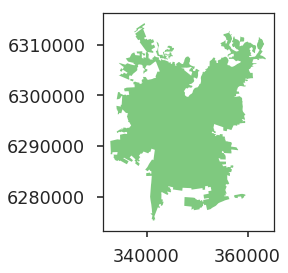

In [10]:
urban_areas[urban_areas.NOMBRE == 'Santiago'].plot()

In [11]:
stgo_area = urban_areas[urban_areas.NOMBRE == 'Santiago'].geometry
stgo_area

385    (POLYGON ((338445.2911 6306151.2221, 338289.25...
Name: geometry, dtype: object

This is not the idiomatic way of doing it, but using geopandas' overlays has lower quality (and unstructured) results.

In [12]:
metropolitan_region['geometry'] = metropolitan_region.geometry.map(lambda x: x.intersection(stgo_area[385]))
urban_municipalities = metropolitan_region[metropolitan_region.area > 0].copy()
urban_municipalities['area_km2'] = urban_municipalities.area / 1000000
#

/home/egraells/.virtualenvs/jupyter/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


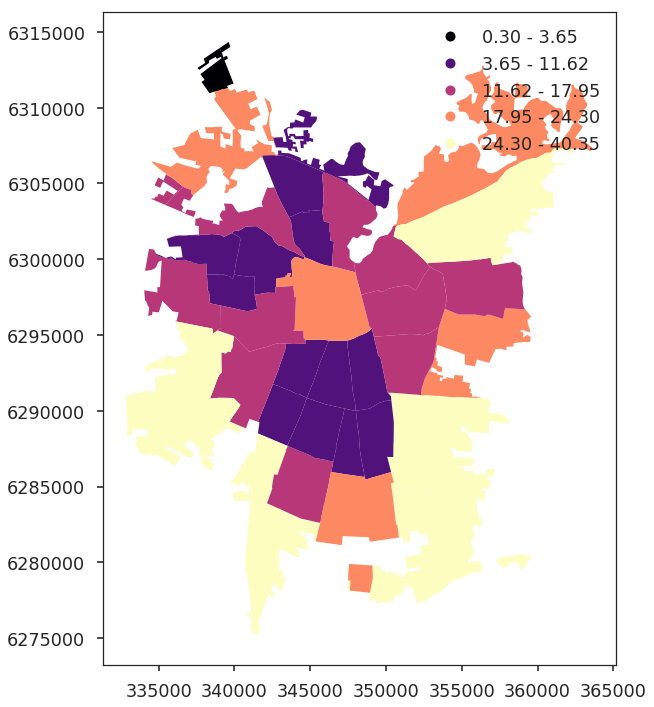

In [13]:
urban_municipalities.plot(figsize=(20,12), column='area_km2', scheme='fisher_jenks', cmap='magma', legend=True)

In [14]:
urban_municipalities.head()

,NOM_REG,NOM_PROV,NOM_COM,SHAPE_LENG,DIS_ELEC,CIR_SENA,COD_COMUNA,SHAPE_Le_1,SHAPE_Area,geometry,area_km2
177,Región Metropolitana de Santiago,Santiago,Independencia,11488.695747,19,7,1310,11718.687086,7.514746e+06,"POLYGON ((345884.0031000003 6302609.6842, 3458...",7.514746
178,Región Metropolitana de Santiago,Santiago,La Florida,49696.426793,26,8,1311,49621.402175,7.103733e+07,"POLYGON ((355737.3829907289 6286882.946599475,...",33.765370
179,Región Metropolitana de Santiago,Santiago,Lo Barnechea,149539.074262,23,8,1311,149865.511039,1.024735e+09,"(POLYGON ((362193.352993806 6307218.971546588,...",24.297415
180,Región Metropolitana de Santiago,Santiago,Lo Espejo,11405.976039,28,8,1311,11389.045242,8.181655e+06,"POLYGON ((342637.7674000002 6291726.7842, 3427...",8.135703
181,Región Metropolitana de Santiago,Santiago,Lo Prado,10795.433316,18,7,1311,10691.672491,6.535088e+06,"POLYGON ((341488.7580000004 6296729.4443, 3414...",6.535088


In [15]:
urban_municipalities = urban_municipalities.to_crs({'init': 'epsg:4326'})

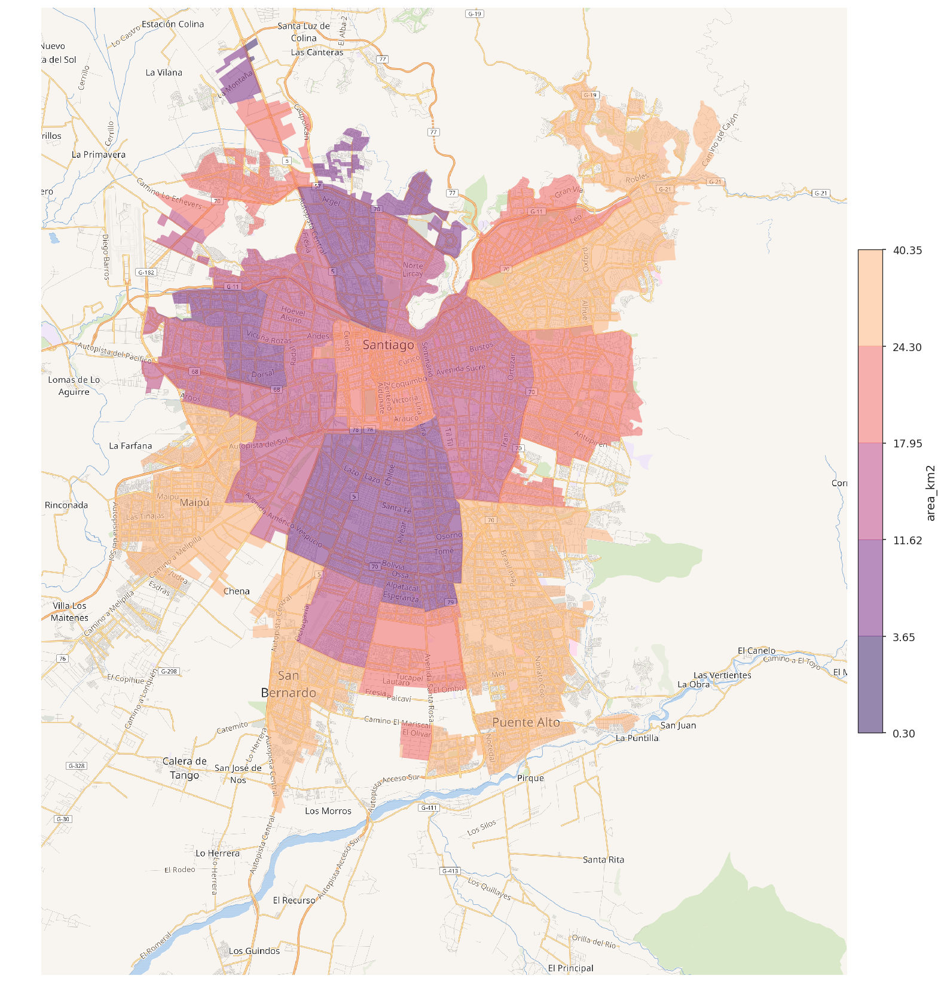

In [17]:
choropleth(urban_municipalities, column='area_km2', scheme='fisher_jenks', palette='magma', figsize=28, alpha=0.5)

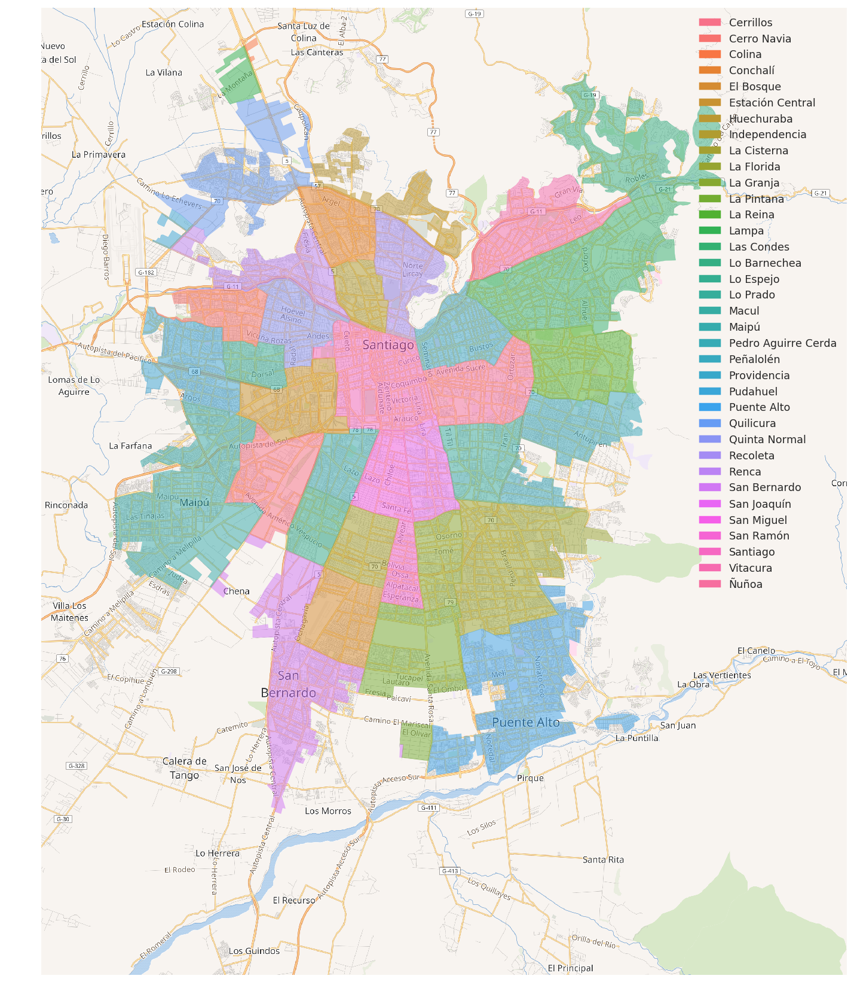

In [18]:
choropleth(urban_municipalities, column='NOM_COM', scheme='categorical', palette='husl', figsize=28, alpha=0.5)

## CASEN Survey 2013

In [19]:
casen = pd.read_csv('./input/2013_casen_survey/Casen2013.csv.gz', sep=',', encoding='iso-8859-1')
casen.sample(3)

/home/egraells/.virtualenvs/jupyter/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (16,18,25,27,38,51,114,234,286,312,316,332,349,360,369) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,folio,o,region,comuna,zona,pco1,sexo,edad,ecivil,...,esc,educ,depen,activ,indmat,indsan,calgobviv,iai,iae,hacinamiento
144395,144395,1.020720e+11,2,10,10207,1,2,2,48,1,...,16.0,11,NaN,1.0,1,1,1,1,1,1
129637,129637,9.115101e+10,3,9,9115,1,3,2,36,7,...,12.0,5,NaN,2.0,1,1,1,2,1,1
175792,175792,1.311910e+11,2,13,13119,1,4,1,6,7,...,NaN,1,3.0,NaN,1,1,1,1,1,1


In [20]:
name_map = dict(zip([13101, 13102, 13103
    ,13104,13105,13106,13107,13108,13109,13110,13111,13112,13113,13114,13115,13116,13117,13118,13119,13120,13121,13122,13123
    ,13124,13125,13126,13127,13128,13129,13130,13131,13132,13201,13202,13203,13301,13302,13303,13401,13402,13403,13404,13501,
    13502, 13503, 13504, 13505, 13601, 13602, 13603, 13604, 13605],
    map(lambda x: x.title(), ['Santiago', 'Cerrillos', 'Cerro Navia', 'Conchalí', 'El Bosque', 'Estación Central', 'Huechuraba', 'Independencia', 'La Cisterna', 'La Florida', 'La Granja', 'La Pintana', 'La Reina', 'Las Condes', 'Lo Barnechea', 
                          'Lo Espejo', 'Lo Prado', 'Macul', 'Maipú', 'Ñuñoa', 'Pedro Aguirre Cerda', 'Peñalolén', 'Providencia', 
                          'Pudahuel', 'Quilicura', 'Quinta Normal', 'Recoleta', 'Renca', 'San Joaquín', 'San Miguel',
                          'San Ramón', 'Vitacura', 'Puente Alto', 'Pirque', 'San José de Maipo', 'Colina',
                          'Lampa', 'Tiltil', 'San Bernardo', 'Buin', 'Calera de Tango', 'Paine',
                          'Melipilla', 'Alhué', 'Curacaví', 'María Pinto', 'San Pedro', 'Talagante',
                          'El Monte', 'Isla de Maipo', 'Padre Hurtado', 'Peñaflor'
])))

# solamente RM
casen = casen[casen.region == 13].copy()
# recuperamos el nombre de acuerdo al diccionario
casen['municipality'] = casen['comuna'].map(lambda x: name_map[x])
# dejamos a quienes respondieron la pregunta que nos interesa (r20) y que están en las comunas urbanas, mayores de 18
casen = casen[(casen.municipality.isin(urban_municipalities.NOM_COM)) 
              & (casen.r20 <= 10)
              & (casen.edad >= 18)].copy()

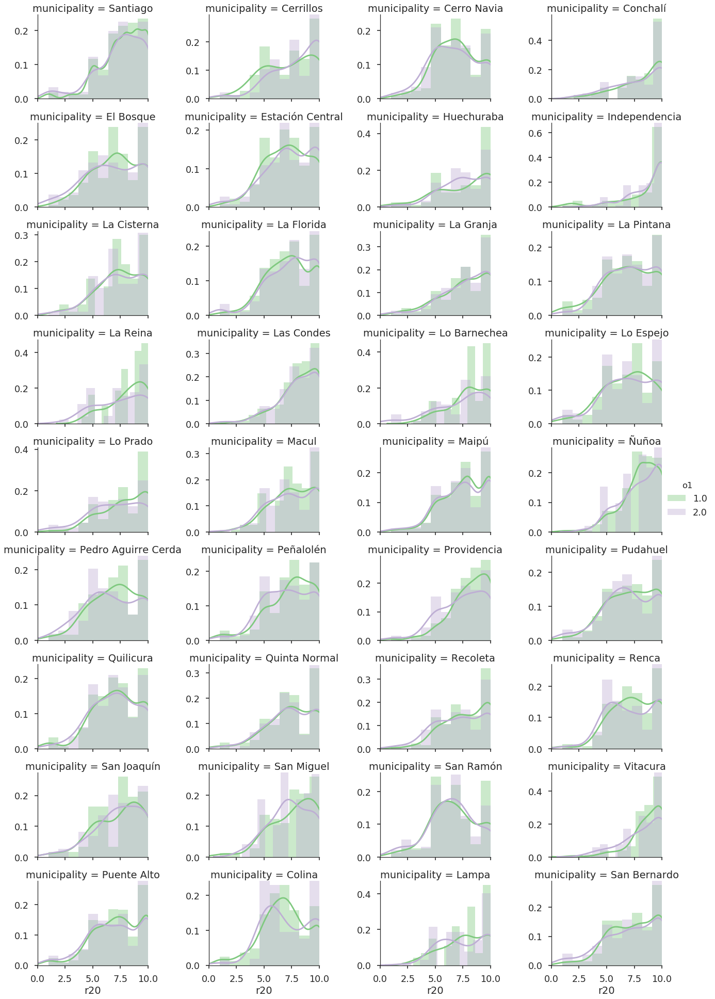

In [21]:
g = sns.FacetGrid(data=casen, col='municipality', hue='o1', col_wrap=4, aspect=1.5, size=3, sharey=False)
g.map(sns.distplot, 'r20', bins=10)
g.set(xlim=[0,10])
g.add_legend()

In [22]:
casen['adjusted_r20'] = casen.r20 * casen.expr_r20
casen_municipality_exp = casen.groupby('municipality').aggregate({'expr_r20': 'sum'})
#casen_municipality_exp

In [23]:
casen_municipality_exp.head()

,expr_r20
municipality,
Cerrillos,82869.0
Cerro Navia,107214.0
Colina,55916.0
Conchalí,84330.0
El Bosque,123270.0


In [24]:
satisfaction = casen.groupby('municipality').aggregate({'r20': 'sum', 'adjusted_r20': 'sum'}).join(casen_municipality_exp)
#satisfaction

In [25]:
satisfaction['exp_average'] = satisfaction['adjusted_r20'] / satisfaction['expr_r20']
satisfaction.head()

,adjusted_r20,r20,expr_r20,exp_average
municipality,,,,
Cerrillos,641107.0,1352.0,82869.0,7.736391
Cerro Navia,751386.0,2277.0,107214.0,7.008283
Colina,428153.0,1049.0,55916.0,7.657075
Conchalí,676105.0,2354.0,84330.0,8.017372
El Bosque,882563.0,2114.0,123270.0,7.159593


In [26]:
urban_satisfaction = satisfaction.loc[urban_municipalities.NOM_COM].copy()

In [27]:
urban_municipalities['life_satisfaction'] = urban_municipalities.NOM_COM.map(lambda x: 
                                                                          urban_satisfaction.loc[x].exp_average)

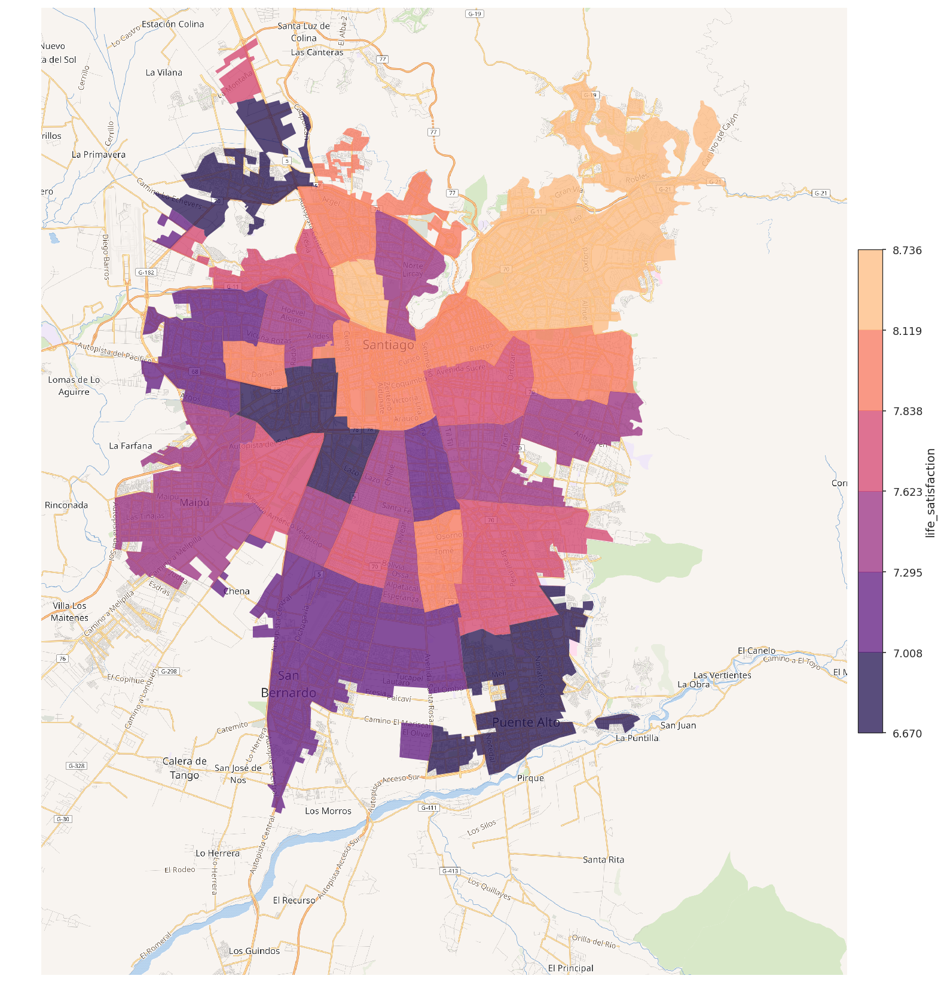

In [28]:
choropleth(urban_municipalities, figsize=28, 
               column='life_satisfaction', palette='magma',
               n_colors=6)

Los promedios son todos "altos". De hecho, gracias a eso se dice que gran parte de los chilenos [está satisfecho con su vida](http://www.plataformaurbana.cl/archive/2015/02/28/encuesta-casen-en-dos-anos-suben-de-63-a-70-los-chilenos-que-estan-felices-con-su-vida/). Sin embargo, Chile también es un país con [preocupantes índices de depresión](http://www.elmostrador.cl/agenda-pais/vida-en-linea/2017/02/23/chile-se-ubica-por-sobre-el-promedio-mundial-en-indice-de-depresion-segun-nuevo-informe-de-la-oms/). Entonces, ¿cómo interpretar estos números?

Proponemos que la manera correcta de hacerlo es ver los índices de satisfacción de manera relativa. Lo que importa no es si alguien dice 7 de 10, sino qué tan arriba o abajo del promedio alguien dice estar satisfecho. Para ello utilizaremos la fórmula de puntaje estándar o $z-score$:

$$z(x) = \frac{x - \mu(x)}{\sigma(x)}$$ 

El puntaje estándar nos dice qué tanto se aleja del promedio un valor, en términos de la desviación estándar del dataset. Lo podemos calcular así:

In [29]:
urban_satisfaction['z_satisfaction'] = ((urban_satisfaction['exp_average'] - urban_satisfaction['exp_average'].mean()) /
                                        urban_satisfaction['exp_average'].std())

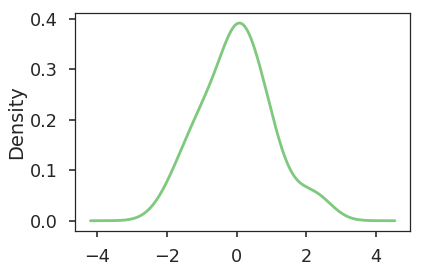

In [32]:
urban_municipalities['z_satisfaction'] = urban_municipalities.NOM_COM.map(lambda x: urban_satisfaction.loc[x].z_satisfaction)
urban_municipalities['z_satisfaction'].plot(kind='density')

Como resultado, observamos que tenemos personas con valores negativos (bajo el promedio) y positivos (sobre el promedio).

Esto permite usar una escala de colores que permite _ver_ mejor esas diferencias:

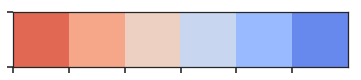

In [34]:
sns.palplot(sns.color_palette('coolwarm_r', n_colors=6))

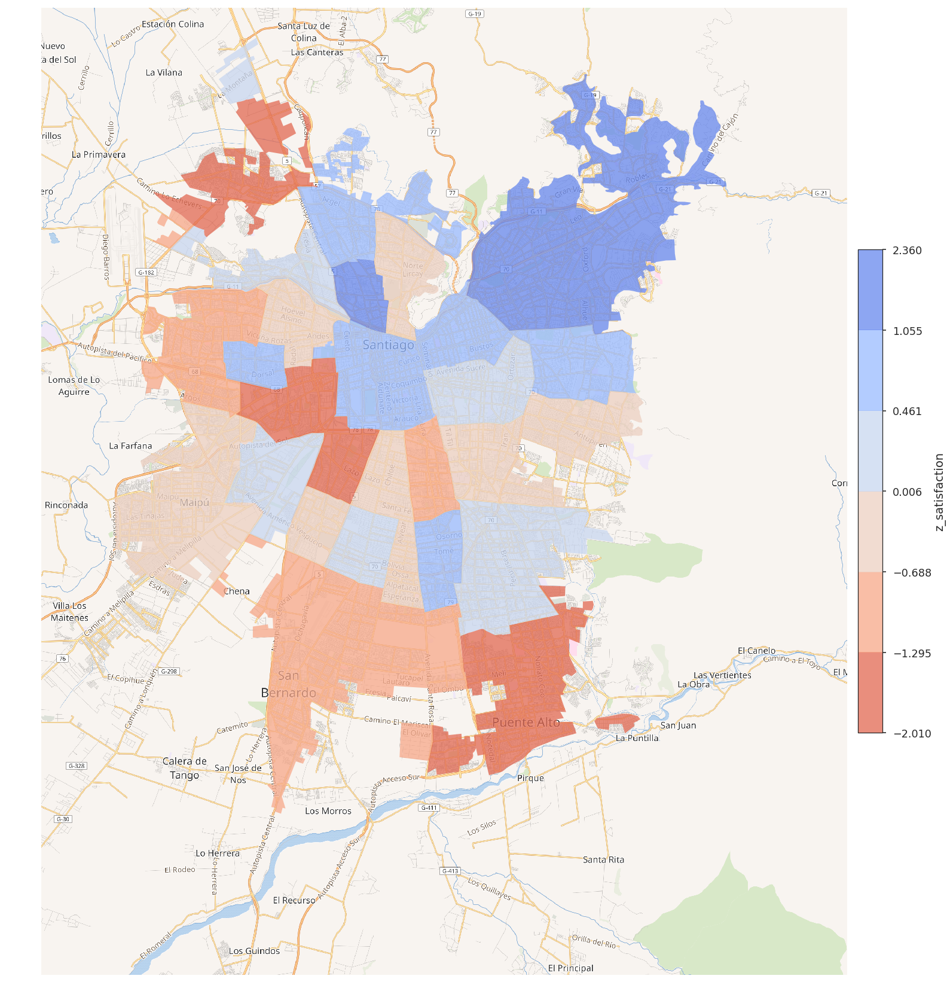

In [36]:
choropleth(urban_municipalities, figsize=28,  column='z_satisfaction', palette='coolwarm_r', n_colors=6)

Parece haber una correlación clara con el nivel de ingreso. Veamos esta variable en la CASEN:

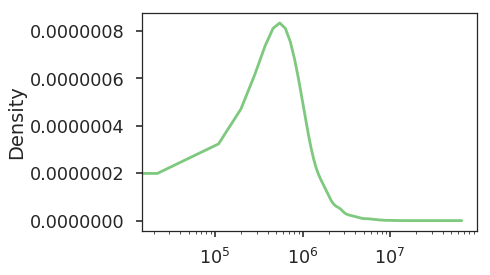

In [37]:
casen.ytotcorh.plot(kind='density')
plt.xscale('log')

Debemos hacer el mismo cálculo de expansión que hicimos para la satisfacción:

In [38]:
casen['adjusted_income'] = casen.ytotcorh * casen.expr
casen_municipality_income_exp = casen.groupby('municipality').aggregate({'expr': 'sum'})
income = casen.groupby('municipality').aggregate({'ytotcorh': 'sum', 'adjusted_income': 'sum'}).join(casen_municipality_income_exp)
income.head()

,ytotcorh,adjusted_income,expr
municipality,,,
Cerrillos,147957764,32595963674,37881
Cerro Navia,228692320,35731363402,52692
Colina,102461713,23280728406,29484
Conchalí,208278030,32270349912,46507
El Bosque,219680291,48034382914,61559


In [39]:
income['exp_income'] = income['adjusted_income'] / income['expr']

In [40]:
income.shape

(36, 4)

In [41]:
income.sort_values(by='exp_income')

,ytotcorh,adjusted_income,expr,exp_income
municipality,,,,
Recoleta,230003060,40094996439,64705,6.196584e+05
La Granja,196694788,33460339394,53238,6.285048e+05
Independencia,121557039,26766762473,42431,6.308303e+05
La Pintana,261661249,48357627646,72623,6.658721e+05
Cerro Navia,228692320,35731363402,52692,6.781174e+05
San Bernardo,463364406,75248660440,109020,6.902280e+05
Pudahuel,343362031,66630286928,96532,6.902404e+05
Conchalí,208278030,32270349912,46507,6.938816e+05
San Ramón,151050915,22530312713,30106,7.483662e+05


In [42]:
urban_municipalities['income'] = urban_municipalities.NOM_COM.map(lambda x: income.loc[x].exp_income)

In [43]:
urban_municipalities.loc[:,('NOM_COM', 'income')].sort_values(by='income')

,NOM_COM,income
302,Recoleta,6.196584e+05
308,La Granja,6.285048e+05
177,Independencia,6.308303e+05
309,La Pintana,6.658721e+05
292,Cerro Navia,6.781174e+05
226,San Bernardo,6.902280e+05
183,Pudahuel,6.902404e+05
293,Conchalí,6.938816e+05
185,San Ramón,7.483662e+05
181,Lo Prado,7.526195e+05


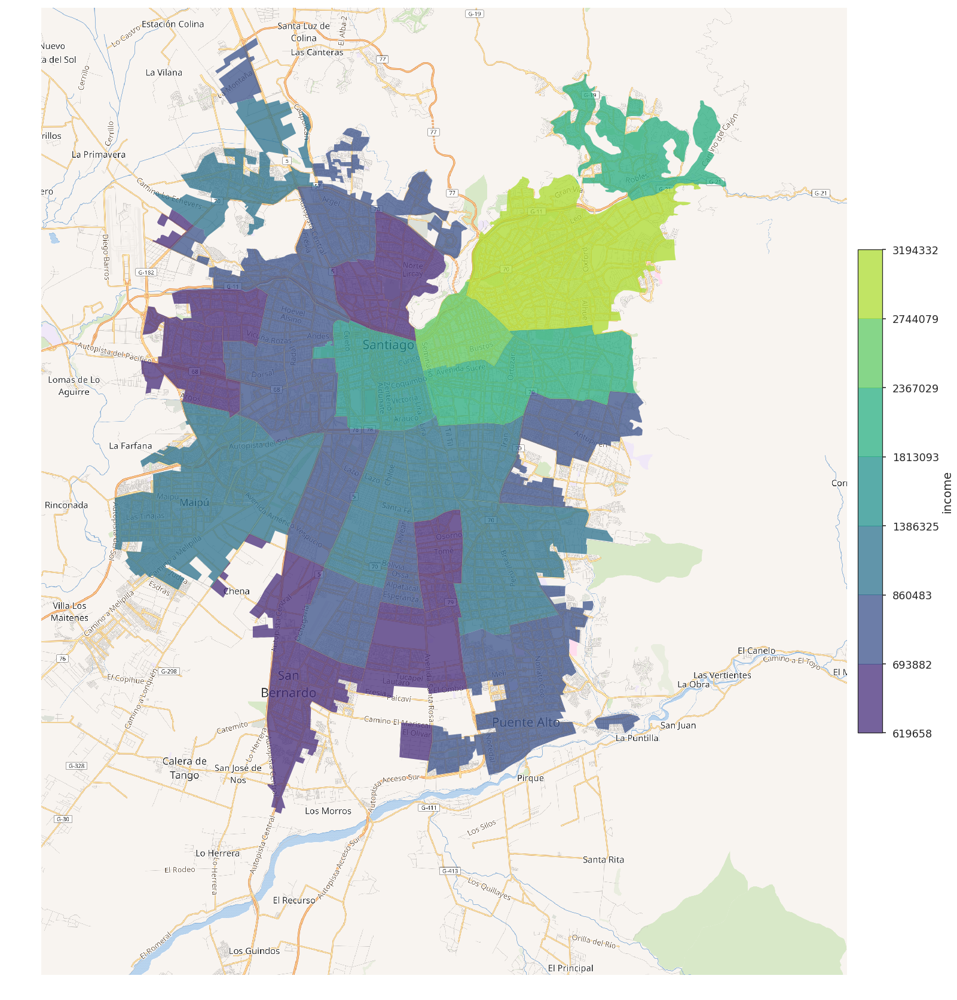

In [45]:
choropleth(urban_municipalities, figsize=28, column='income', palette='viridis', n_colors=7)

Ahora bien, viendo los mapas parece haber una correlación, pero... ¿existe realmente? Podemos utilizar el método `jointplot` que visualiza una posible correlación utilizando el [coeficiente de Pearson](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient):

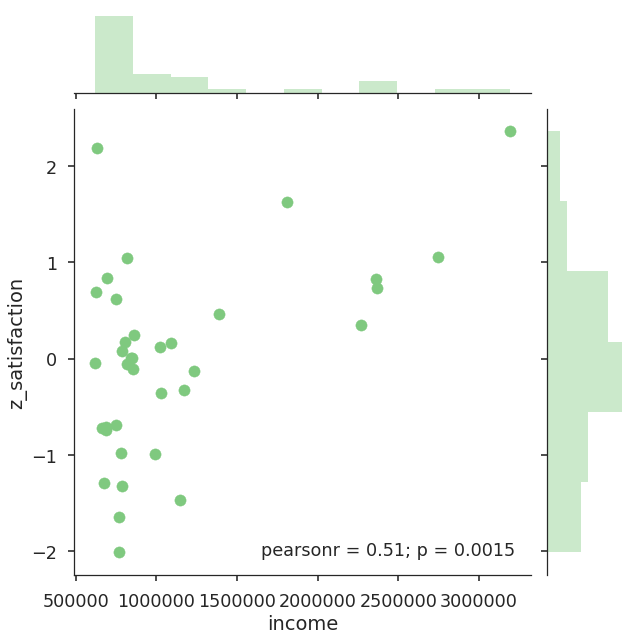

In [46]:
sns.jointplot('income', 'z_satisfaction', urban_municipalities, size=9)

Efectivamente hay una correlación alta y significativa ($\rho = 0.51$). ¿Qué otros análisis similares podemos hacer?